In [6]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns

In [9]:
colnames = pd.read_csv('UCI HAR Dataset/features.txt', delim_whitespace=True, header=None, index_col=0)

In [10]:
duplicated_cols = colnames.loc[colnames.duplicated()].index
unique_duplicated_colnames = np.unique(colnames.loc[colnames.duplicated()])
print(colnames.loc[colnames.duplicated()])
y_z_cols_duplicated = colnames.loc[colnames.duplicated()]
y_cols_duplicated = y_z_cols_duplicated.loc[~ y_z_cols_duplicated.duplicated()]
z_cols_duplicated = y_z_cols_duplicated.loc[y_z_cols_duplicated.duplicated()]

y_cols_duplicated = y_cols_duplicated.apply(lambda name: name + '_Y') 
z_cols_duplicated = z_cols_duplicated.apply(lambda name: name + '_Z')

x_set = set(unique_duplicated_colnames)
y_z_cols_renamed = pd.concat([y_cols_duplicated, z_cols_duplicated])
print(y_z_cols_renamed)
colnames.loc[duplicated_cols] = y_z_cols_renamed
new_colnames = colnames.apply(lambda row: row[1] + '_X' if row[1] in x_set else row[1], axis=1)

                                 1
0                                 
317     fBodyAcc-bandsEnergy()-1,8
318    fBodyAcc-bandsEnergy()-9,16
319   fBodyAcc-bandsEnergy()-17,24
320   fBodyAcc-bandsEnergy()-25,32
321   fBodyAcc-bandsEnergy()-33,40
..                             ...
498  fBodyGyro-bandsEnergy()-17,32
499  fBodyGyro-bandsEnergy()-33,48
500  fBodyGyro-bandsEnergy()-49,64
501   fBodyGyro-bandsEnergy()-1,24
502  fBodyGyro-bandsEnergy()-25,48

[84 rows x 1 columns]
                                   1
0                                   
317     fBodyAcc-bandsEnergy()-1,8_Y
318    fBodyAcc-bandsEnergy()-9,16_Y
319   fBodyAcc-bandsEnergy()-17,24_Y
320   fBodyAcc-bandsEnergy()-25,32_Y
321   fBodyAcc-bandsEnergy()-33,40_Y
..                               ...
498  fBodyGyro-bandsEnergy()-17,32_Z
499  fBodyGyro-bandsEnergy()-33,48_Z
500  fBodyGyro-bandsEnergy()-49,64_Z
501   fBodyGyro-bandsEnergy()-1,24_Z
502  fBodyGyro-bandsEnergy()-25,48_Z

[84 rows x 1 columns]


In [4]:
X = pd.read_csv('UCI HAR Dataset/train/X_train.txt', header=None, delim_whitespace=True, error_bad_lines=False)

In [5]:
X.columns = new_colnames

In [6]:
X.duplicated().sum()

0

In [7]:
X.isnull().sum().sum()

0

In [8]:
X.max().max()

1.0

In [9]:
X.min().min()

-1.0

In [10]:
X.sample(5)

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-meanFreq(),fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)"
5909,0.279105,-0.017281,-0.105930,-0.997706,-0.994612,-0.994559,-0.998032,-0.993724,-0.994735,-0.942136,...,0.345450,-0.575813,-0.859778,-0.476129,-0.094960,-0.048262,-0.404952,-0.322583,-0.202076,-0.333628
2406,0.269086,-0.019658,-0.116023,-0.991605,-0.967660,-0.979146,-0.993172,-0.971272,-0.981517,-0.930461,...,0.192234,-0.150100,-0.479265,0.052690,0.107837,0.729876,0.011054,-0.520428,0.238376,0.326308
6785,0.345140,-0.049027,-0.070294,-0.044084,-0.035533,0.127463,-0.126494,-0.060943,0.151984,0.209970,...,-0.041200,-0.727900,-0.954964,-0.491348,0.723206,-0.912048,0.224922,-0.776498,0.251369,-0.002243
1443,0.199635,0.005512,-0.068680,0.009620,-0.126713,0.124024,-0.097453,-0.196435,0.081502,0.466573,...,0.232297,-0.424333,-0.789447,0.658158,0.329510,0.866157,0.083916,-0.676997,0.162649,0.240615
6803,0.277473,-0.012490,-0.108726,-0.997428,-0.979366,-0.988299,-0.997581,-0.978052,-0.988742,-0.942646,...,0.149389,-0.285449,-0.569935,0.066259,0.012861,0.548829,-0.802928,-0.916751,0.155775,0.016556


In [11]:
y = pd.read_csv('UCI HAR Dataset/train/y_train.txt', header=None, names=['label'])
y['label'] = y['label'].map({
    1: 'WALKING',
    2: 'WALKING_UPSTAIRS',
    3: 'WALKING_DOWNSTAIRS',
    4: 'SITTING',
    5: 'STANDING',
    6: 'LAYING'})
df = pd.concat([X,y], axis=1)

## Jak wygląda Y?

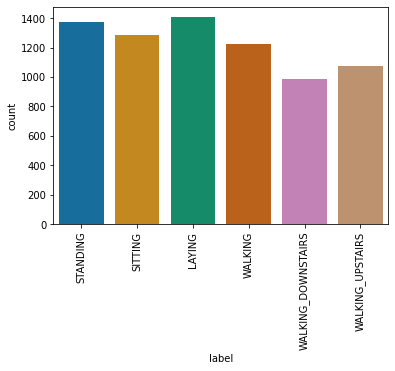

In [12]:
sns.countplot(x = df['label'], palette = "colorblind")
plt.xticks(rotation=90)
plt.show()

Najmniej jest próbek z chodzenia po schodach. Co ciekawe, próbek ze schodzenia po schodach jest mniej niż z wchodzenia po schodach. Dane zostały podzielone po czasie. Możemy wywnioskować, że ludzie szybciej schodzą po schodach niż wchodzą.

In [12]:
def plot_var(varname):
    sns.displot(df, x=varname, hue='label', kind='kde')
    plt.show()

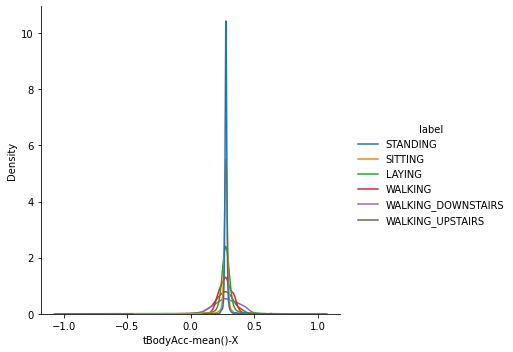

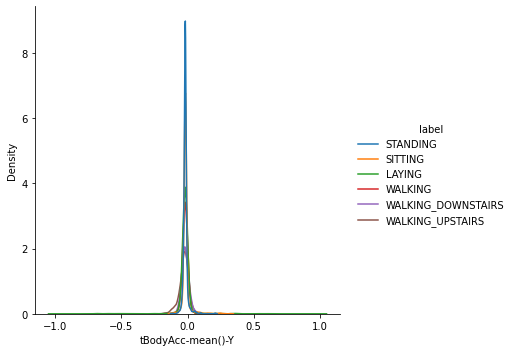

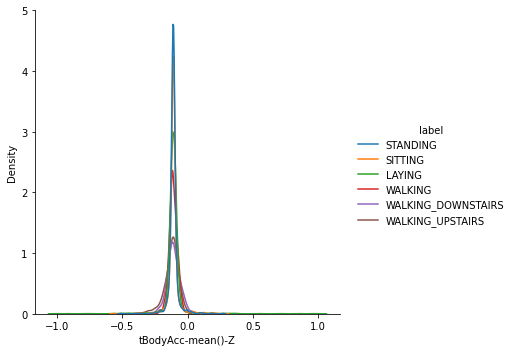

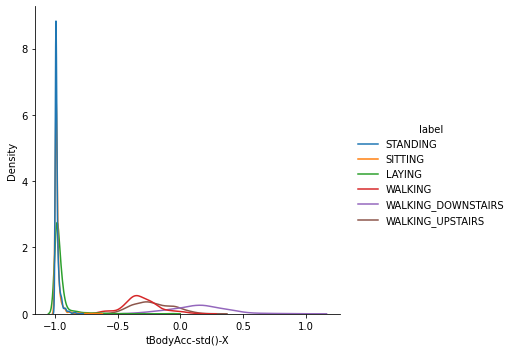

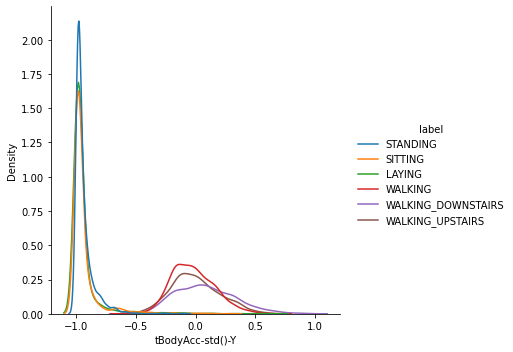

...

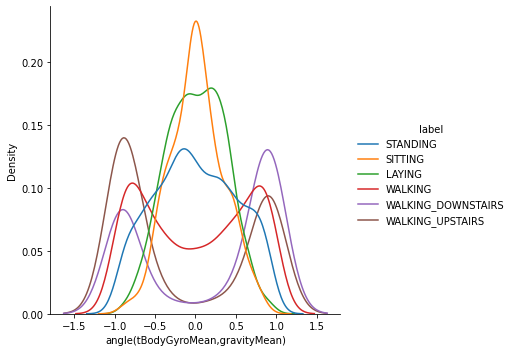

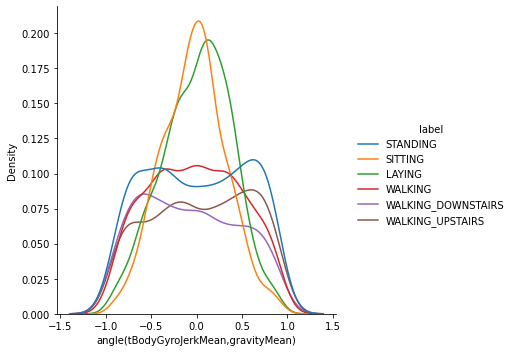

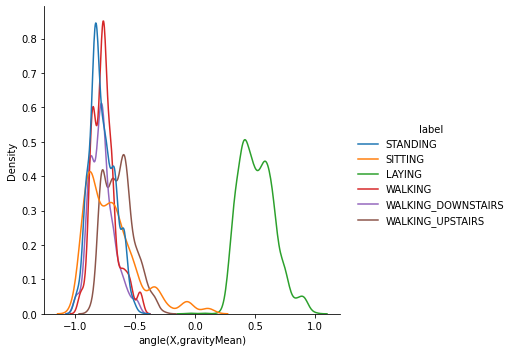

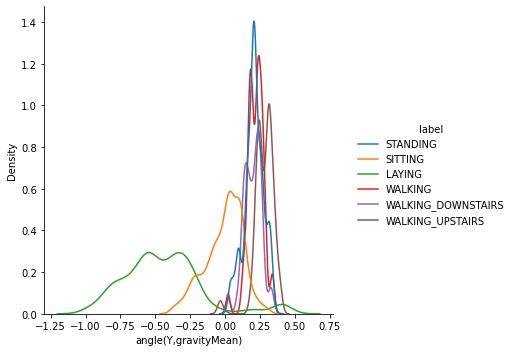

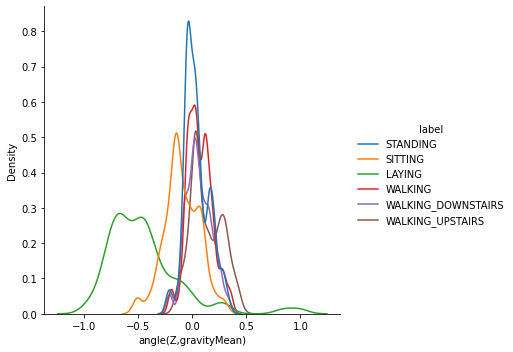

In [13]:


for varname in X_unique.columns:
    plot_var(varname)


In [14]:
corr_matrix = df.corr()

In [15]:
from itertools import combinations

def absHighPass(df, absThresh):
    passed = set()
    for (r,c) in combinations(df.columns, 2):
        if (abs(df.loc[r,c]) >= absThresh):
            passed.add(r)
            passed.add(c)
    passed = sorted(passed)
    return df.loc[passed,passed]

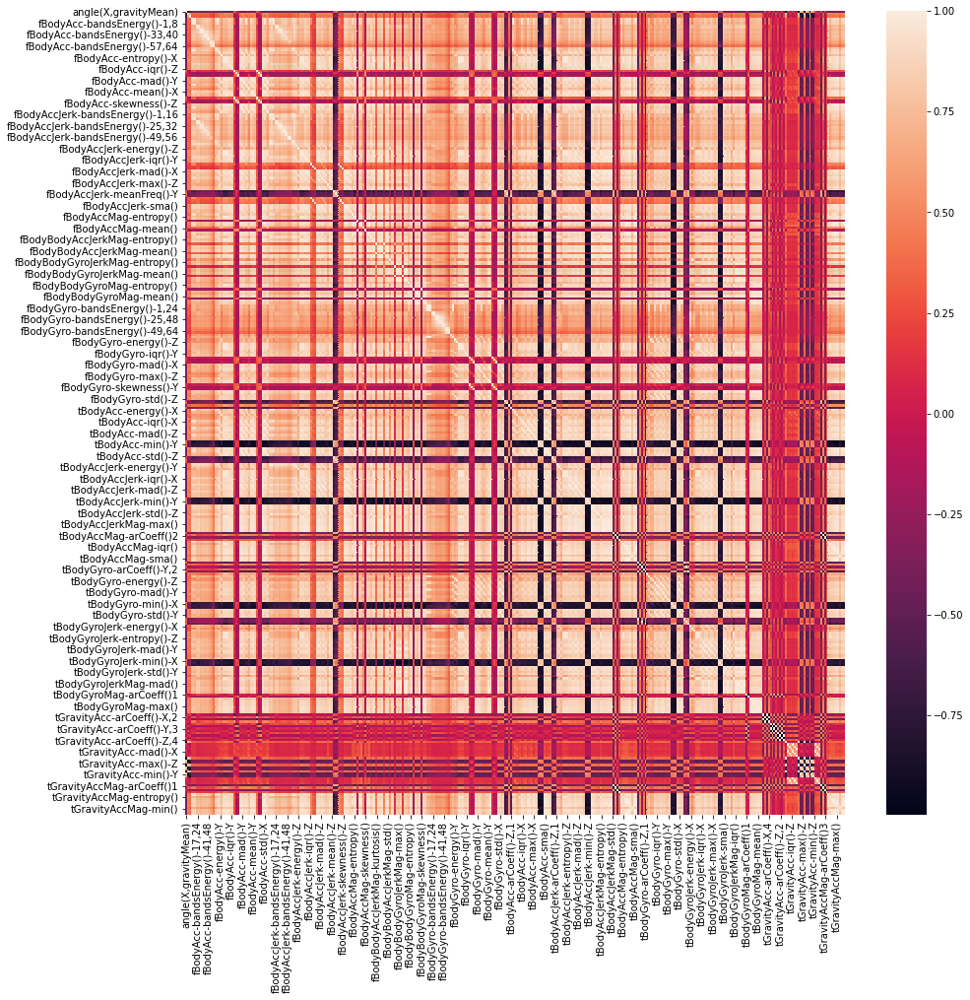

In [16]:
fig, ax = plt.subplots(figsize=(15,15))

sns.heatmap(data = absHighPass(corr_matrix,0.9), ax=ax)
plt.show()

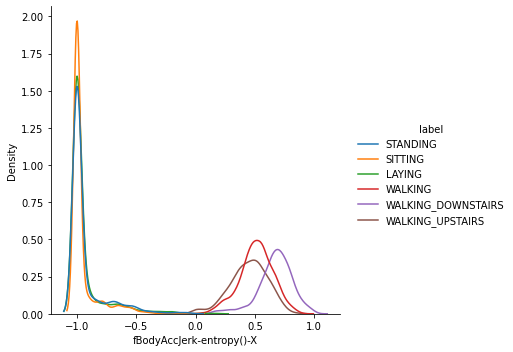

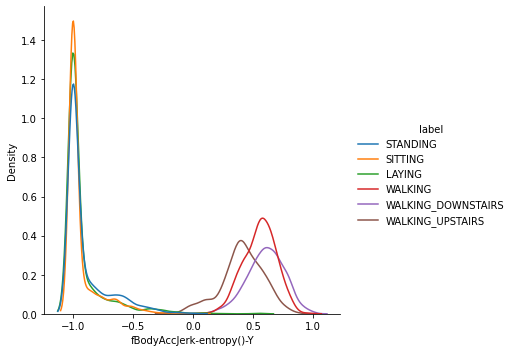

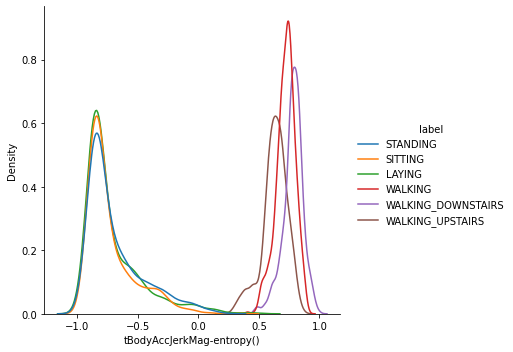

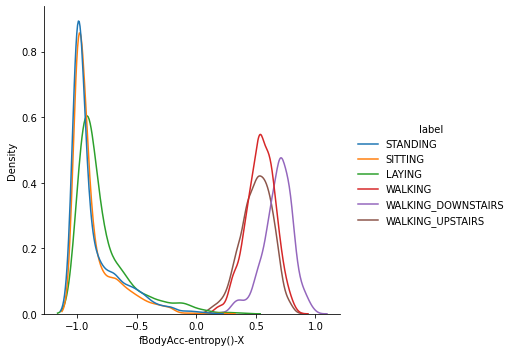

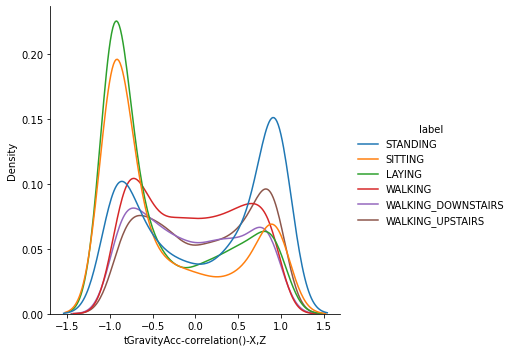

...

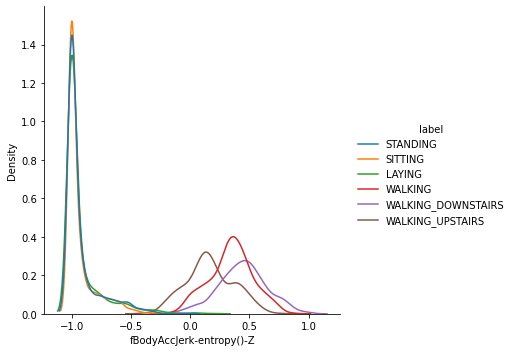

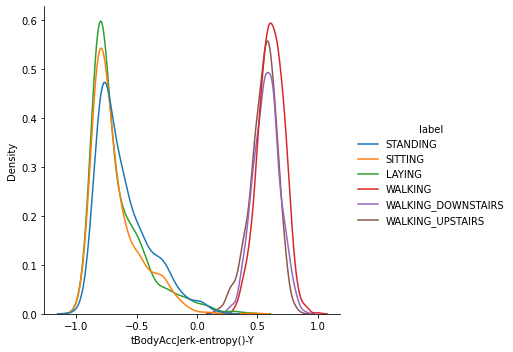

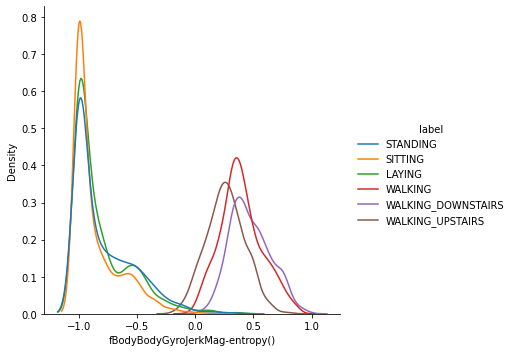

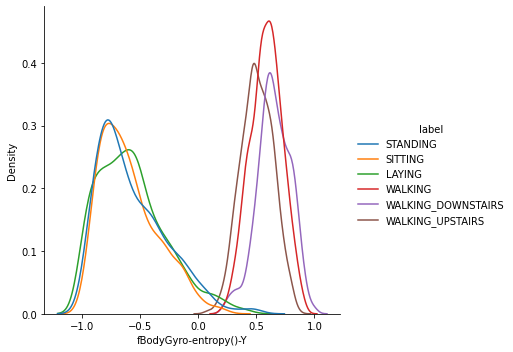

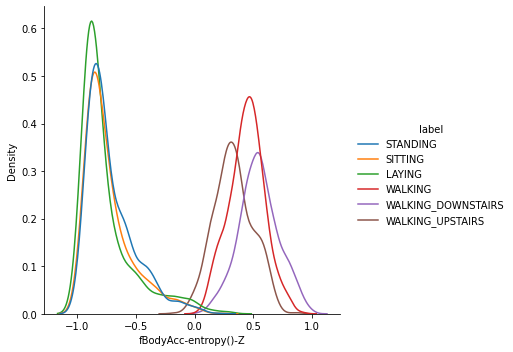

In [17]:
high_var_cols = df.var().sort_values(ascending=False).head(20).index.tolist()
for varname in high_var_cols:
    plot_var(varname)

In [18]:
df.describe()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-meanFreq(),fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)"
count,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,...,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000
mean,0.274488,-0.017695,-0.109141,-0.605438,-0.510938,-0.604754,-0.630512,-0.526907,-0.606150,-0.468604,...,0.125293,-0.307009,-0.625294,0.008684,0.002186,0.008726,-0.005981,-0.489547,0.058593,-0.056515
std,0.070261,0.040811,0.056635,0.448734,0.502645,0.418687,0.424073,0.485942,0.414122,0.544547,...,0.250994,0.321011,0.307584,0.336787,0.448306,0.608303,0.477975,0.511807,0.297480,0.279122
min,-1.000000,-1.000000,-1.000000,-1.000000,-0.999873,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-0.995357,-0.999765,-0.976580,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,0.262975,-0.024863,-0.120993,-0.992754,-0.978129,-0.980233,-0.993591,-0.978162,-0.980251,-0.936219,...,-0.023692,-0.542602,-0.845573,-0.121527,-0.289549,-0.482273,-0.376341,-0.812065,-0.017885,-0.143414
50%,0.277193,-0.017219,-0.108676,-0.946196,-0.851897,-0.859365,-0.950709,-0.857328,-0.857143,-0.881637,...,0.134000,-0.343685,-0.711692,0.009509,0.008943,0.008735,-0.000368,-0.709417,0.182071,0.003181
75%,0.288461,-0.010783,-0.097794,-0.242813,-0.034231,-0.262415,-0.292680,-0.066701,-0.265671,-0.017129,...,0.289096,-0.126979,-0.503878,0.150865,0.292861,0.506187,0.359368,-0.509079,0.248353,0.107659
max,1.000000,1.000000,1.000000,1.000000,0.916238,1.000000,1.000000,0.967664,1.000000,1.000000,...,0.946700,0.989538,0.956845,1.000000,1.000000,0.998702,0.996078,1.000000,0.478157,1.000000


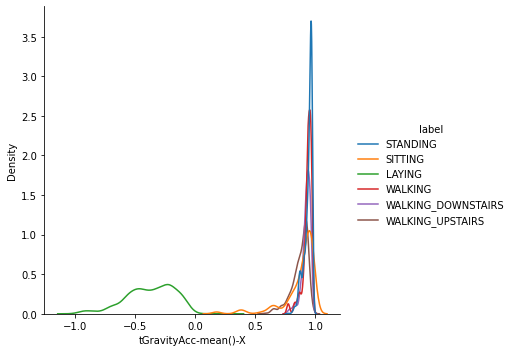

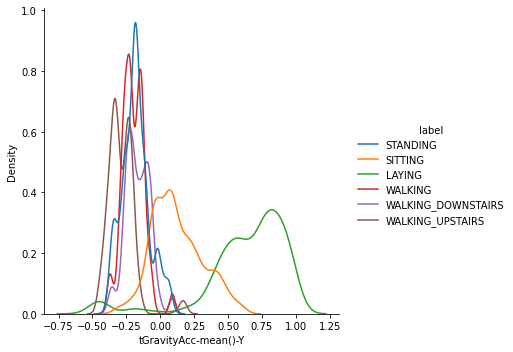

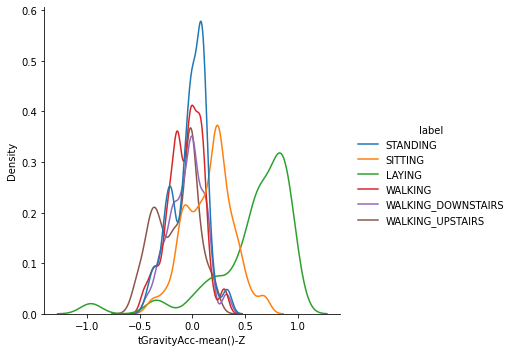

In [19]:
for varname in ['tGravityAcc-mean()-X',
                'tGravityAcc-mean()-Y',
                'tGravityAcc-mean()-Z']:
    plot_var(varname)

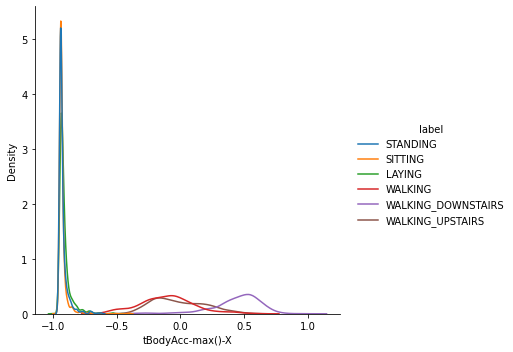

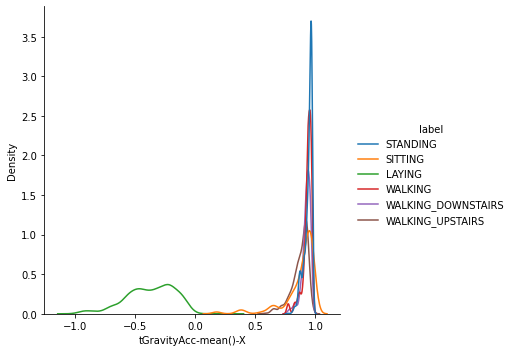

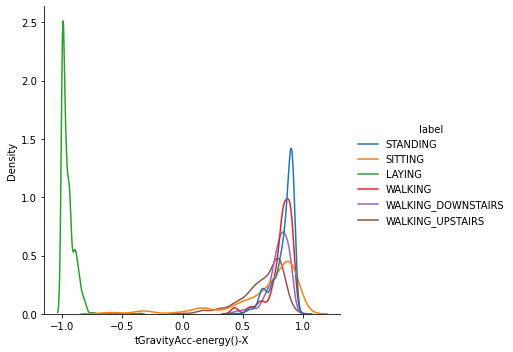

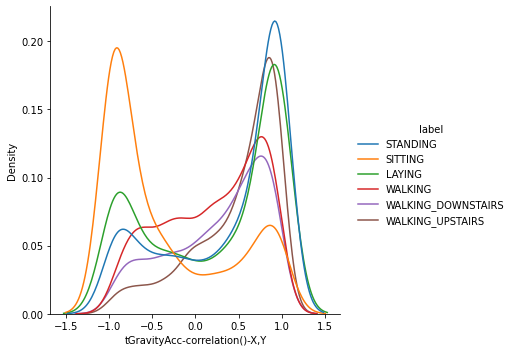

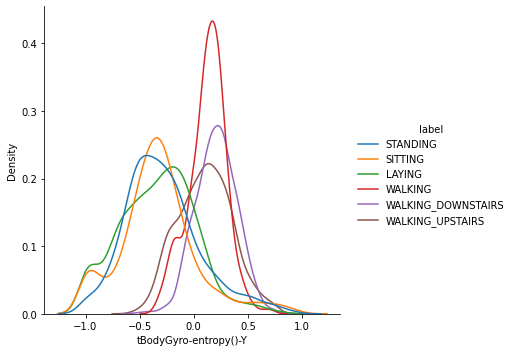

...

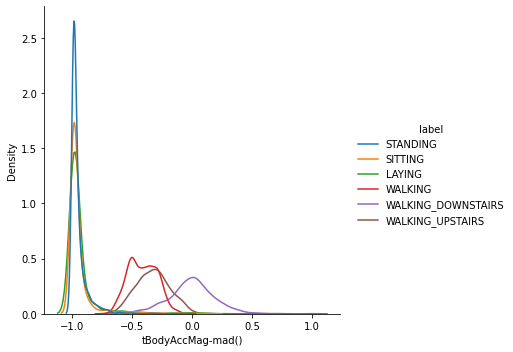

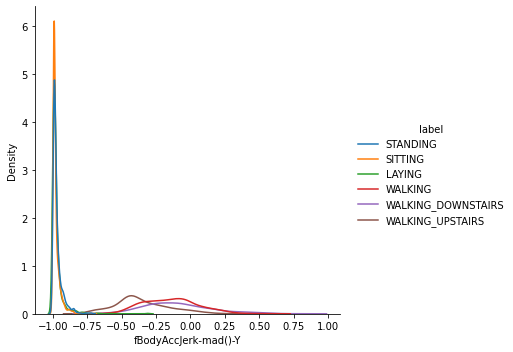

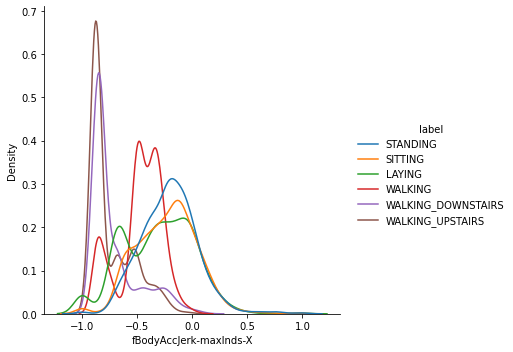

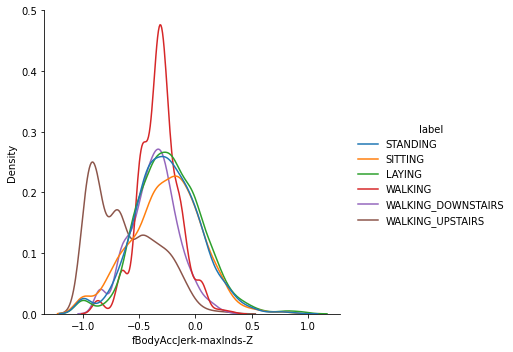

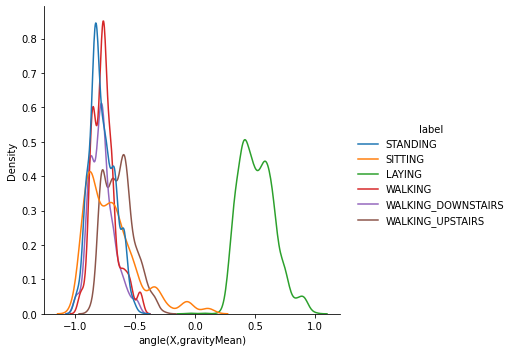

In [20]:
significant_cols = [
'tBodyAcc-max()-X',
'tGravityAcc-mean()-X',
'tGravityAcc-energy()-X',
'tGravityAcc-correlation()-X,Y',
'tBodyGyro-entropy()-Y',
'tBodyGyroJerk-entropy()-Z',
'tBodyAccMag-mad()',
'fBodyAccJerk-mad()-Y',
'fBodyAccJerk-maxInds-X',
'fBodyAccJerk-maxInds-Z',
'angle(X,gravityMean)'
]

for varname in significant_cols:
    plot_var(varname)

In [21]:
small_df = df.loc[:, significant_cols]
small_corr = small_df.corr()

In [22]:
small_df.isnull().sum()

tBodyAcc-max()-X                 0
tGravityAcc-mean()-X             0
tGravityAcc-energy()-X           0
tGravityAcc-correlation()-X,Y    0
tBodyGyro-entropy()-Y            0
tBodyGyroJerk-entropy()-Z        0
tBodyAccMag-mad()                0
fBodyAccJerk-mad()-Y             0
fBodyAccJerk-maxInds-X           0
fBodyAccJerk-maxInds-Z           0
angle(X,gravityMean)             0
dtype: int64

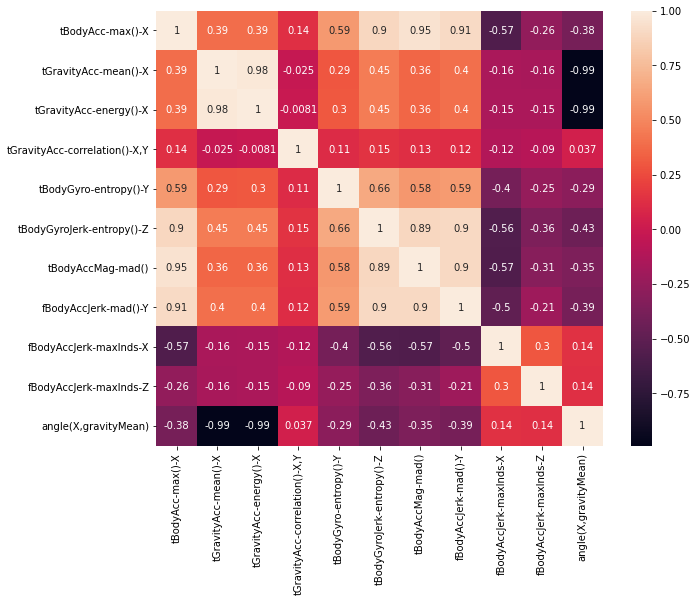

In [23]:
fig, ax = plt.subplots(figsize=(10,8))

sns.heatmap(data = small_corr, ax=ax, annot=True)
plt.show()